In [1]:
%reset
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import netCDF4 as nc
import matplotlib.ticker as mticker
import warnings; warnings.filterwarnings('ignore')
import cmocean
from gsw import rho

Once deleted, variables cannot be recovered. Proceed (y/[n])? y


In [2]:
%cd /net2/smg/documents/OMDT/analysis_CM2p6/grids
os = xr.open_dataset('ocean.static.nc')
fs=xr.open_dataset('ocean_grid.nc')
depth=fs['ht'][:,:]

lon=fs['geolon_t']; lat=fs['geolat_t']
# Coriolis is 2Omega sin(phi) where phi is the latitude of the B-grid velocity point, which should be available in hgrid
Coriolis = 2*7.29e-5*np.sin(fs['geolat_t']/360 *2*np.pi);
#dx = fs['dxt']; dy = fs['dyt']; dxy= (dx**2+dy**2)**0.5
#print(os,fs)

/net2/smg/documents/OMDT/analysis_CM2p6/grids


### For CM2.6 data:

In [3]:
%cd /archive/Richard.Slater/CM2.6/CM2.6_A_Control-1860_V03/history
#%ls
u = xr.open_dataset('02020101.ocean_minibling_field_u.nc')['u']
v = xr.open_dataset('02020101.ocean_minibling_field_v.nc')['v']
salt = xr.open_dataset('02020101.ocean_minibling_field_salt.nc')['salt']
temp = xr.open_dataset('02020101.ocean_minibling_field_temp.nc')['temp']

z = u.st_ocean
z_edges  = xr.open_dataset('02020101.ocean_minibling_field_u.nc')['st_edges_ocean']
thickness= z_edges.diff('st_edges_ocean').rename({'st_edges_ocean': 'st_ocean'}).assign_coords({"st_ocean":u.st_ocean})

print(thickness)

/arch2/rds/CM2.6/CM2.6_A_Control-1860_V03/history
<xarray.DataArray 'st_edges_ocean' (st_ocean: 50)>
array([ 10.06709957,  10.09290028,  10.12890053,  10.17849922,
        10.24740219,  10.34269714,  10.47480392,  10.6576004 ,
        10.9101944 ,  11.25960541,  11.74169922,  12.40619659,
        13.32000732,  14.57260132,  16.28289795,  18.604599  ,
        21.73239136,  25.90260315,  31.3868103 ,  38.4697876 ,
        47.40710449,  58.35928345,  71.30871582,  85.9883728 ,
       101.85479736, 118.14520264, 134.01159668, 148.69128418,
       161.64074707, 172.59289551, 181.53027344, 188.61315918,
       194.09741211, 198.26745605, 201.39550781, 203.71704102,
       205.42749023, 206.67993164, 207.59399414, 208.25805664,
       208.74047852, 209.08984375, 209.34228516, 209.52539062,
       209.65722656, 209.75244141, 209.82177734, 209.87109375,
       209.90673828, 209.93310547])
Coordinates:
  * st_ocean  (st_ocean) float64 5.034 15.1 25.22 ... 5.185e+03 5.395e+03


In [4]:
mask = temp[-1,0,:,:]*0.0+1.
Beta = Coriolis.differentiate('yt_ocean')*360/(2*np.pi*6378000)
Beta = (Beta.fillna(0.))*mask
Beta = Beta.rename({'xt_ocean': 'xu_ocean','yt_ocean': 'yu_ocean'})

Text(0.5, 1.0, 'Beta ($1/(m\\cdot s)$)')

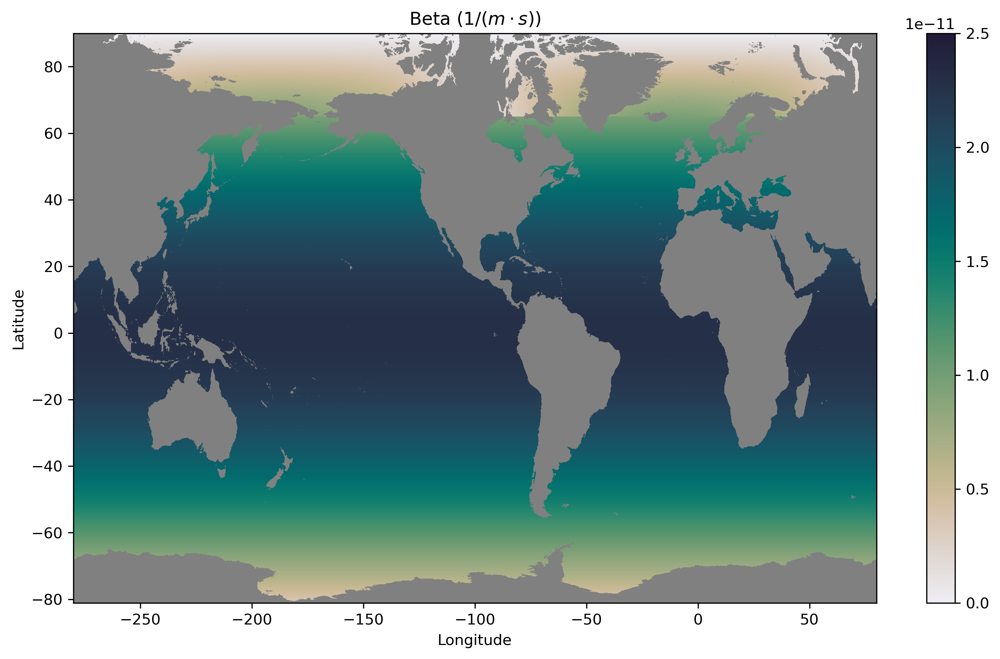

In [5]:
fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')

plot1=Beta.plot(vmin=0,vmax=2.5e-11,cmap=cmocean.cm.rain)

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='grey')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Beta ($1/(m\cdot s)$)')

In [18]:
%%time
mask_3D = u[-1,:,:,:]*0.0+1.
thickness_test = mask_3D*thickness


u_eddy = u[0:5,:]-u[0:5,:].mean('time')
print('done 1')
v_eddy = v[0:5]-v[0:5].mean('time')
print('done 2')
velocity = ((u_eddy**2+v_eddy**2)**0.5).mean('time')
velocity_BT = ((velocity*thickness_test/thickness_test.sum('st_ocean')).sum('st_ocean'))
print(velocity_BT.shape)


done 1
done 2
(2700, 3600)
CPU times: user 1min 29s, sys: 2min 32s, total: 4min 2s
Wall time: 4min 12s


Text(0.5, 1.0, 'Barotropic RMS eddy velocity ($m/s$), CM2.6')

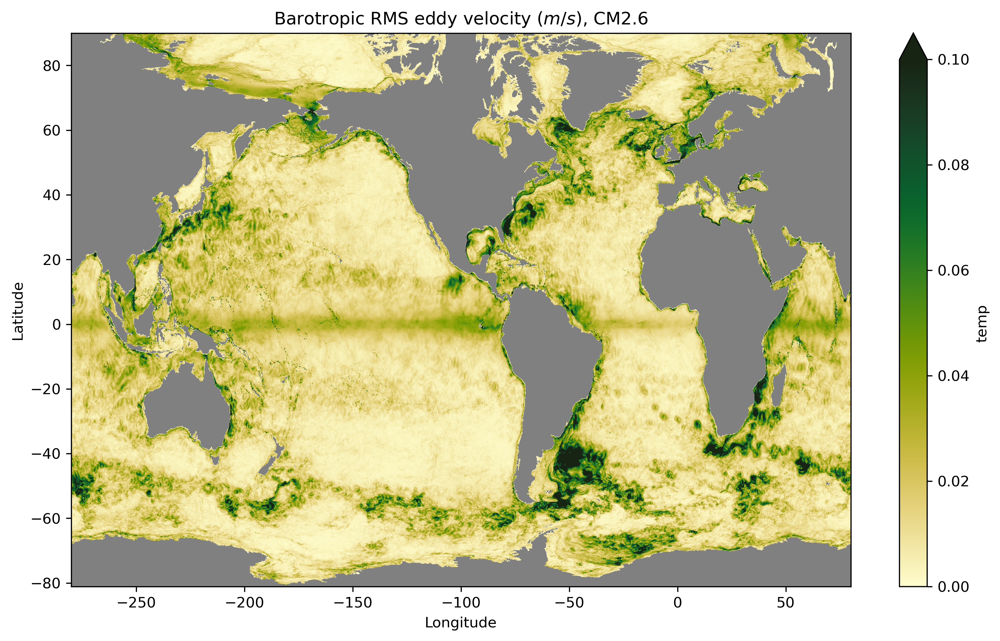

In [19]:
fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')
velocity_plotting=np.array(velocity_BT)*mask
plot1=velocity_plotting.plot(vmin=0,vmax=1e-1,cmap=cmocean.cm.speed)

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='grey')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Barotropic RMS eddy velocity ($m/s$), CM2.6')

Text(0.5, 1.0, '$L_{Rhines}$ ($km$), CM2.6')

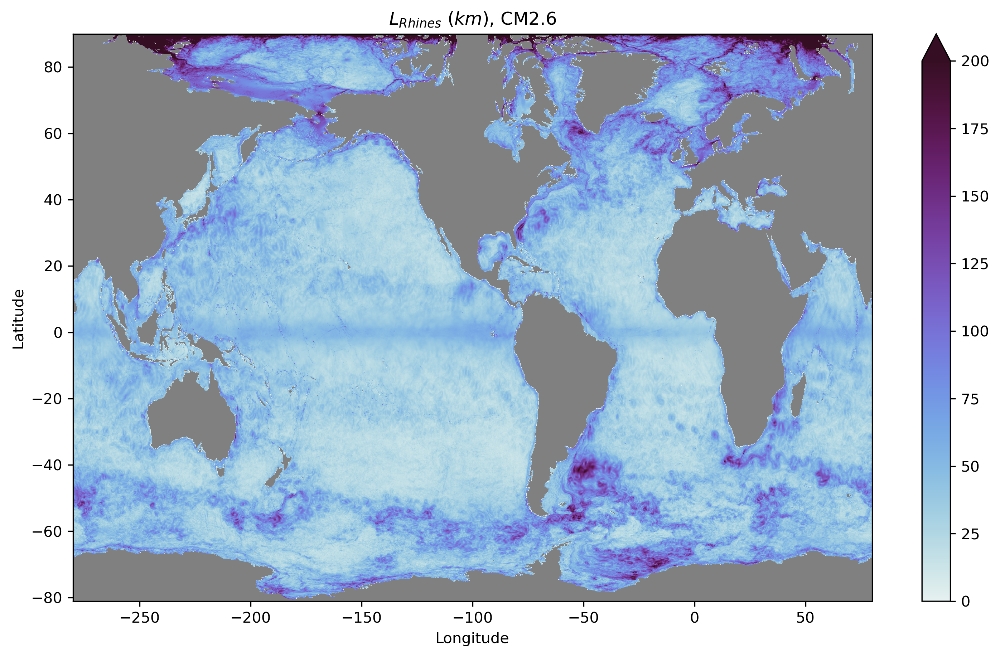

In [22]:
fig = plt.figure(figsize=(12, 7), dpi= 300, facecolor='w', edgecolor='k')
L_rhines = ((np.array(velocity_BT)*2/np.array(Beta))**0.5)*np.array(mask)/1000
L_rhines = xr.DataArray(L_rhines,dims   = ['yt_ocean','xt_ocean'],coords={'xt_ocean':temp.xt_ocean,'yt_ocean':temp.yt_ocean})


plot1=L_rhines.plot(vmin=0,vmax=200,cmap=cmocean.cm.dense)

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='grey')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('$L_{Rhines}$ ($km$), CM2.6')

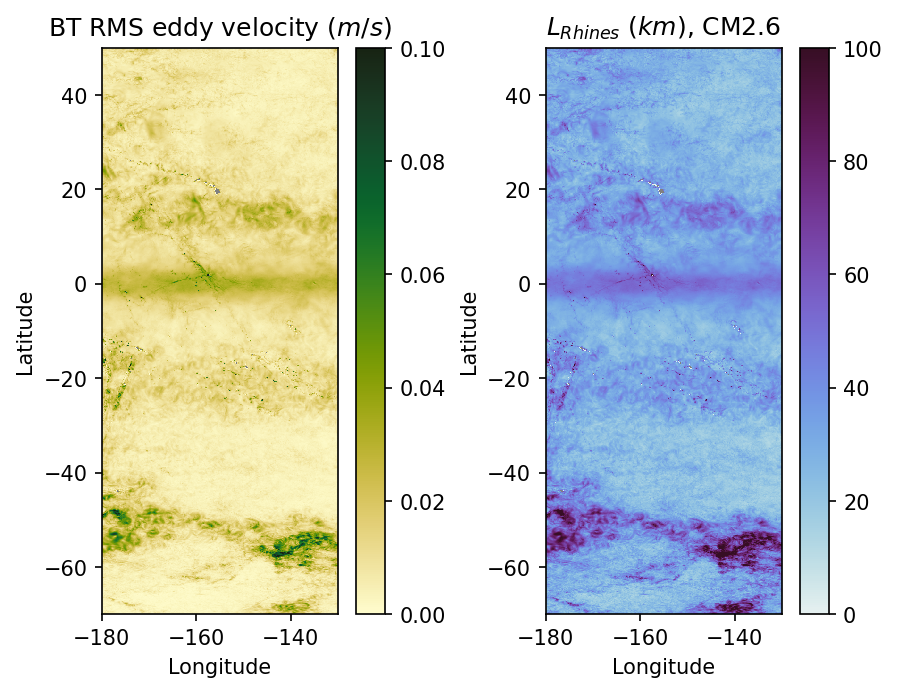

In [23]:

fig = plt.figure(figsize=(7, 5), dpi= 150, facecolor='w', edgecolor='k')

plt.subplot(1,2,1)
velocity_plotting=np.array(velocity_BT)*mask
plot1=velocity_plotting.plot(vmin=0,vmax=1e-1,cmap=cmocean.cm.speed,add_colorbar=False,xlim=[-180,-130],ylim=[-70,50])
plt.colorbar(plot1)

current_cmap = plot1.get_cmap()
current_cmap.set_bad(color='grey')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('BT RMS eddy velocity ($m/s$)')
plt.gca().set_aspect('equal')

plt.subplot(1,2,2)
plot2=L_rhines.plot(vmin=0,vmax=100,cmap=cmocean.cm.dense,add_colorbar=False,xlim=[-180,-130],ylim=[-70,50])
plt.colorbar(plot2)

current_cmap = plot2.get_cmap()
current_cmap.set_bad(color='grey')

plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('$L_{Rhines}$ ($km$), CM2.6')
plt.gca().set_aspect('equal')





Text(0.5, 1.0, 'Rhines Scale CM2.6')

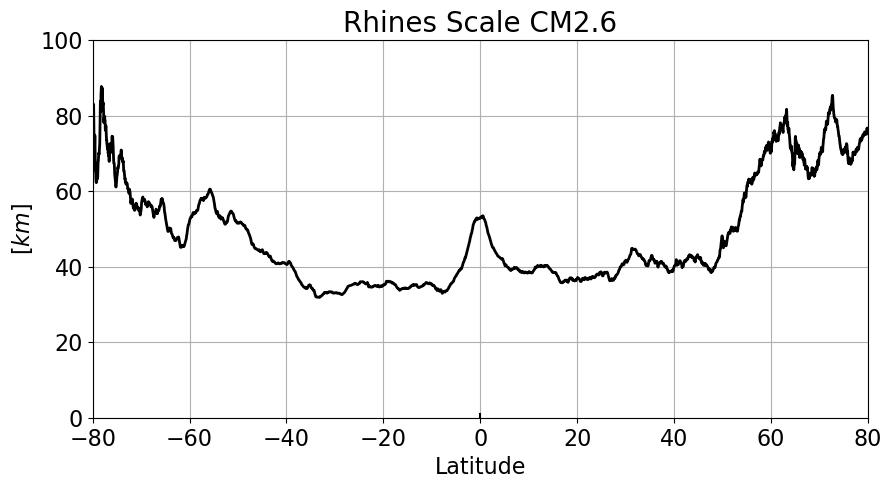

In [24]:
plt.figure(figsize=(10, 5), dpi= 100, facecolor='w', edgecolor='k')

plt.plot(L_rhines['yt_ocean'],L_rhines.mean('xt_ocean'),'-',c='k',linewidth=2)
plt.grid()

#plt.legend(['BT','BC'],loc='upper right',fontsize=11,handlelength=2)
plt.plot([0, 0],[0, 1],'-',color=[0,0,0])
plt.xlim(-80, 80); plt.xticks(fontsize=16);
plt.ylim(0,100); plt.yticks(fontsize=16);
plt.ylabel('$[km]$',fontsize=16)
plt.xlabel('Latitude',fontsize=16)
plt.title('Rhines Scale CM2.6',fontsize=20)

In [25]:
%cd /work/eay/CM2.6
ds = xr.Dataset({'L_rhines': (L_rhines)})
print('done')
ds.to_netcdf('L_rhines_CM2.6.nc', 'w')
%ls


/work2/eay/CM2.6
done
.cshrc: No such file or directory.
2D Spectra CM2.ipynb                              IrmingerSea_temp.nc
ArgentineBasin_salt.nc                            IrmingerSea_u.nc
ArgentineBasin_temp.nc                            IrmingerSea_v.nc
ArgentineBasin_u.nc                               LD_QG_CM2.6.nc
ArgentineBasin_v.nc                               L_rhines_CM2.6.nc
Barotropic_velocities.nc                          ooi_Argb_CM26_eofs.nc
Barotropization and modes.ipynb                   SouthernOcean_salt.nc
BT_BC_KE_partitioning.ipynb                       SouthernOcean_temp.nc
CM2_1deg_data/                                    SouthernOcean_u.nc
CM2.5_data/                                       SouthernOcean_v.nc
CM2.6 Deformation Radius Flat Bottom Modes.ipynb  StationPAPA_salt.nc
CM2.6_depth.nc                                    StationPAPA_temp.nc
CM2.6_Ratio_BTBC_KE_mean.nc                       StationPAPA_u.nc
CM2.6_Ratio_BTBC_KE.nc                       

In [26]:
L_rhines.shape

(2700, 3600)